# YOLO系列算法

## 从区域推荐到端到端


RCNN系列的方法和核心思想在于：**先找出可能存在物体的区域，再确认物体的存在**

这种思路归根溯源，来自传统的目标检测算法。

为了解决传统方法中的滑动窗口的方式，来找出可能存在目标的区域，从而提高检测效率。

这种方法固然取得了优秀的性能，但是存在一个关键问题：**慢**

### 一种更加直接的思路：端到端

对于先找到目标区域再预测的过程，我们可以采用一种更加直接的方式：让模型自动地识别出最终的目标。

我们只是为模型提供一个初始规则后，就可以让机器自动地识别出目标位置。

实际上，上述思路变换的本质来源于问题的定义的变换。

在之前的目标检测方法中，是将检测问题视为两个问题的组合：分类和回归(分类是核心问题）

然而，在端到端的问题上，是把检测问题视为一个典型的回归模型。

即然是回归模型，就是要预测一组数字，这个数字可以描述图像中目标的位置和类别。

那么我们用有序的位置组合以及onehot类别向量作为预期输出，即可实现可靠的目标检测。

### 端到端应该输出什么？

我们应当如何规定YOLO的输出，才可以直接得到目标位置？

为了检测出目标的输出，应当包含以下内容：

* 框的位置(4个点定义一个方框)
* 物体类别(n维one hot向量)
* 置信度(这个框和这个类别有多大的把握)

对于VOC数据集，每个框，我们可以得到一个(4+1+20=25)个长度的向量，作为ground truth。

想象中，我们可以将一张图像的框生成一个25维的向量，用CNN去预测出这些向量。解析结果以后，可以得到目标位置和类别。

然而，他会造成一个新的问题：**每个图像的框可能并不一致，因此需要预测不同的输出尺寸。**

显然，这在CNN中行不通。

### YOLO v1的输出格式

yolo v1的输出为一个 $N\times N\times M$的三维向量。

具体上：

第一步：将图像定义成$N\times N$个区域，如下：

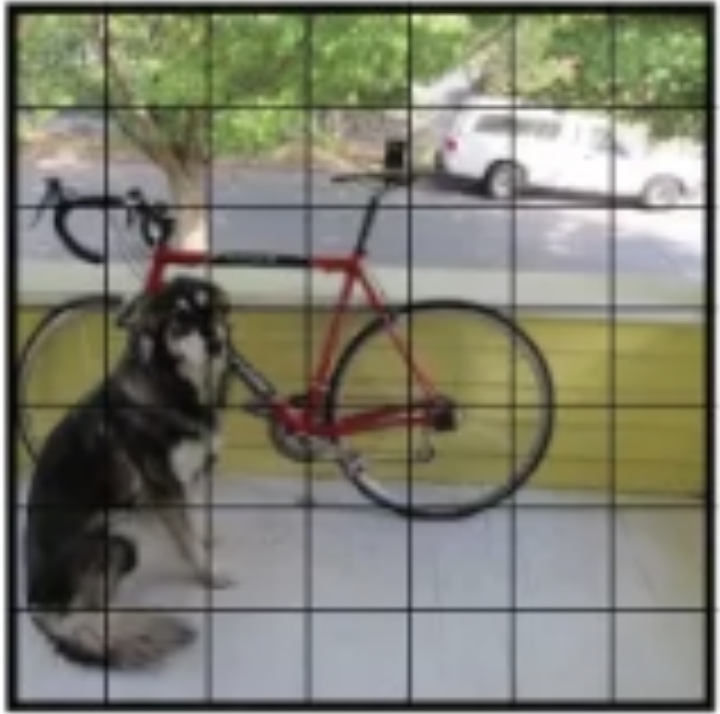

第二步：每个区域会产生两个proposal

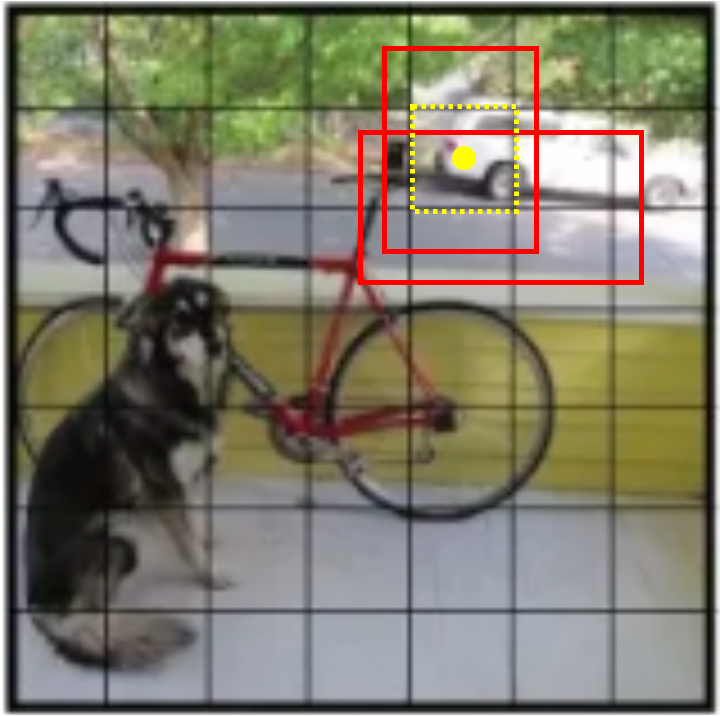

第三步：对于每个proposal，都有：

    * 置信度：1维向量
    * 框坐标：4维向量
    * 分类值：20维向量
    
因此，一个proposal的分类值为1+4+20=25.

然而，由于一个区域要产生两个框，因此proposal为(1+4)\*2 + 20 = 30

假设一个图像被划分成7\*7的区域，则最终的输出尺寸为： $7\times7\times30$

## YOLO v1的算法细节

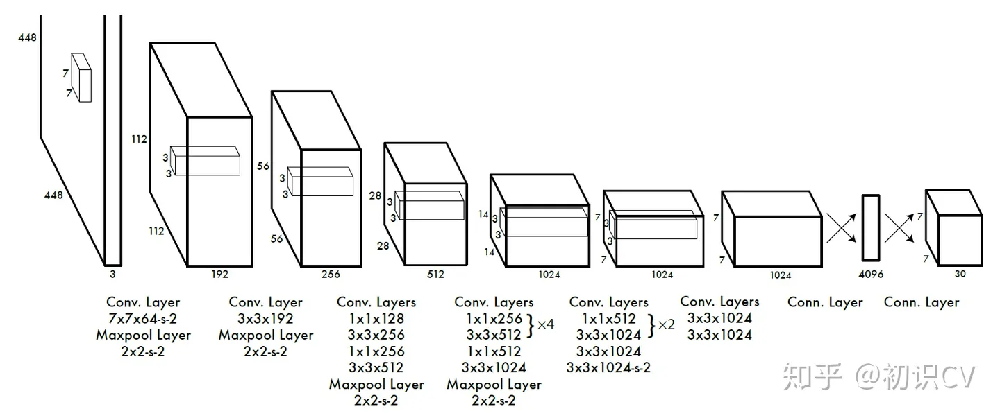

1. 图像输入后，经过卷积池化等步骤，得到一个$7\times7\times1024$的feature map
2. 特征图链接fc后，得到一个4096维的向量
3. 4096的向量进而进入fc后，得到一个1470的特征向量
4. 将特征reshape后，得到一个$7\times7\times30的向量$

### 预测

在预测阶段，一张图像输入后，得到$7\times7\times30$张量

对于每个$30$维的向量，都可以得到两个bounding box。

每个bounding box都存在一个置信度，设置一个阈值，删除掉置信度较低的框

剩余的框画在图像，就有：

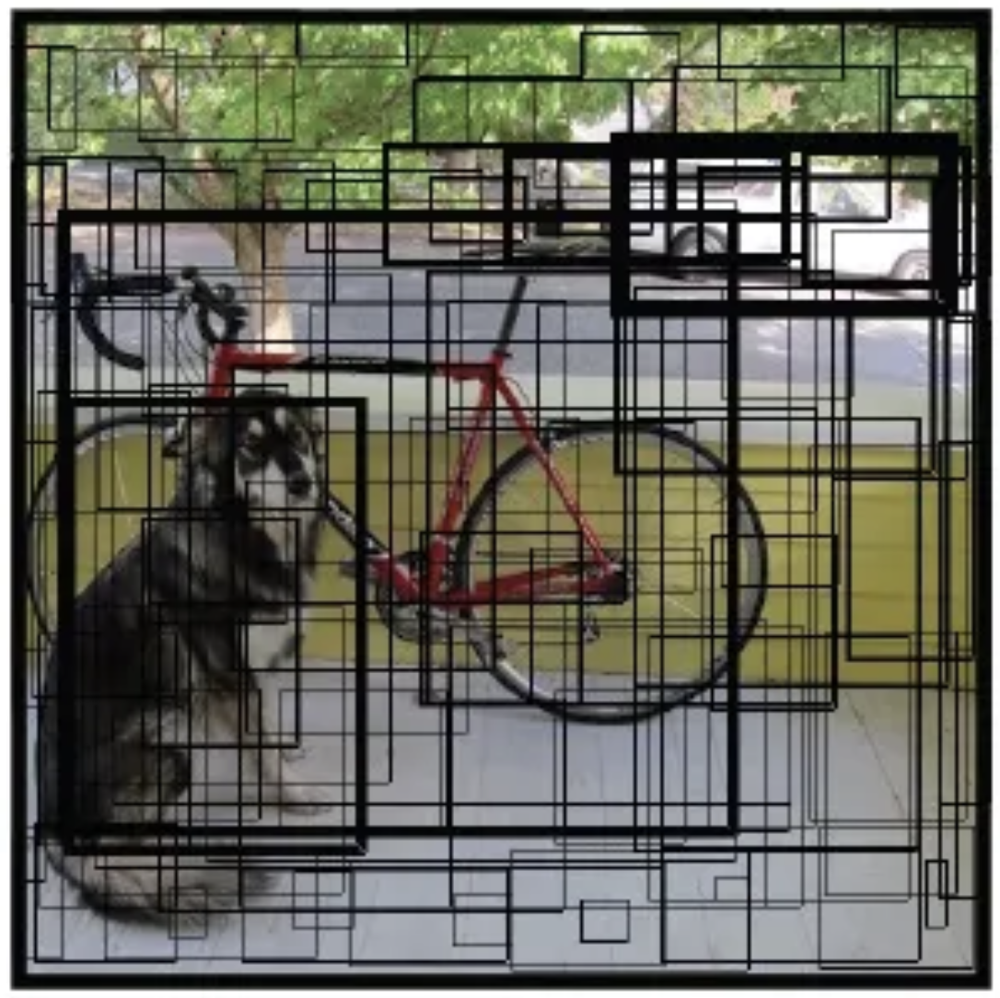

其中，框越粗，置信度越高。

将7\*7的类别对图像涂色，有

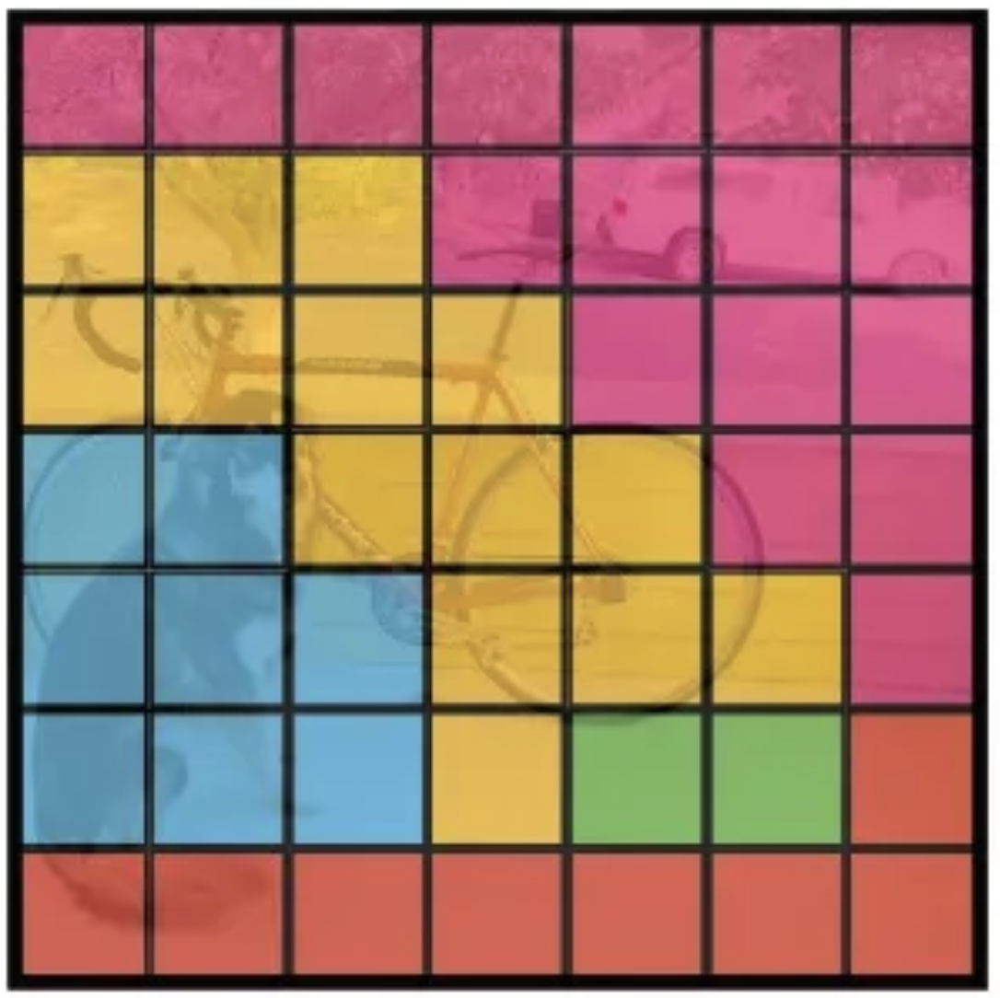

最后，利用NMS对同类框进行抑制，得到最终的框如下

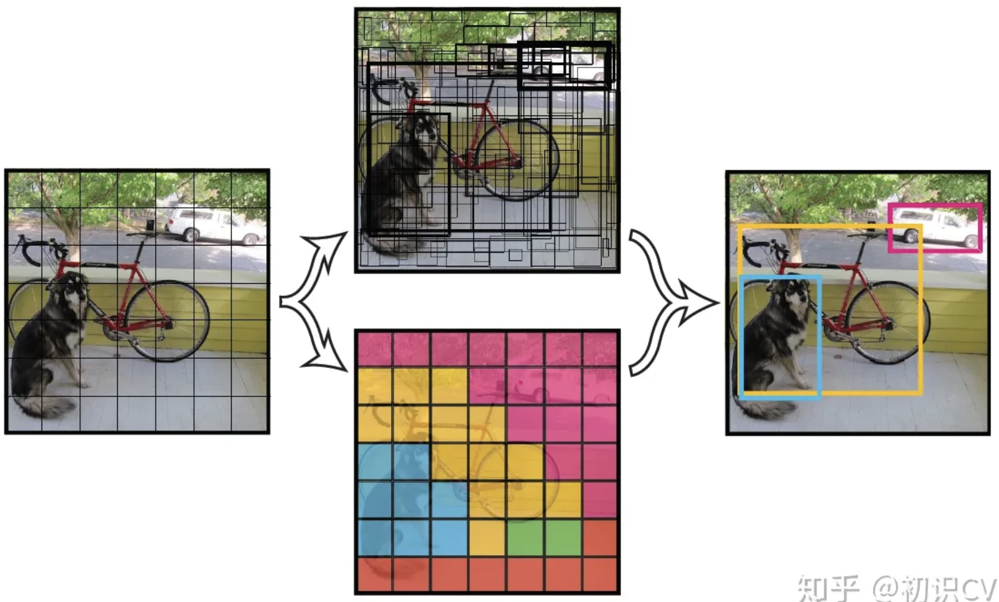

### 训练

损失函数是实现回归的最重要问题。

对于一个这样的输出，应当设置什么样的损失函数？

**分段特征的损失**

针对一个向量中不同的内容，应当设置不同的损失函数。

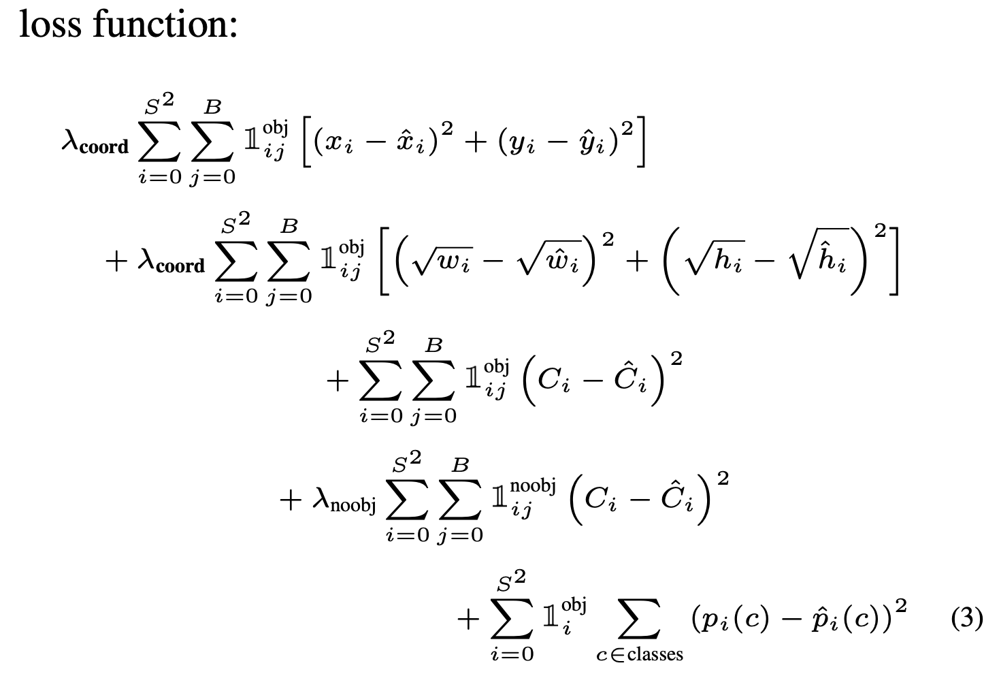

**第一项**：

中心点损失：采用均方误差来实现

**第二项**：

缩放损失：采用均方误差实现，为了统一不同尺度目标的结果，采用了平方根的方法归一化

**第三项**：

含有目标的置信度损失，赋予较大的权重，增加目标区域对于置信度的影响

**第四项**：

不含目标的置信度损失，赋予较小的权重，减少非目标区域对于置信度的影响

**第五项**：

分类损失



**其他细节**

如何将ground truth转换成yolo的输出？

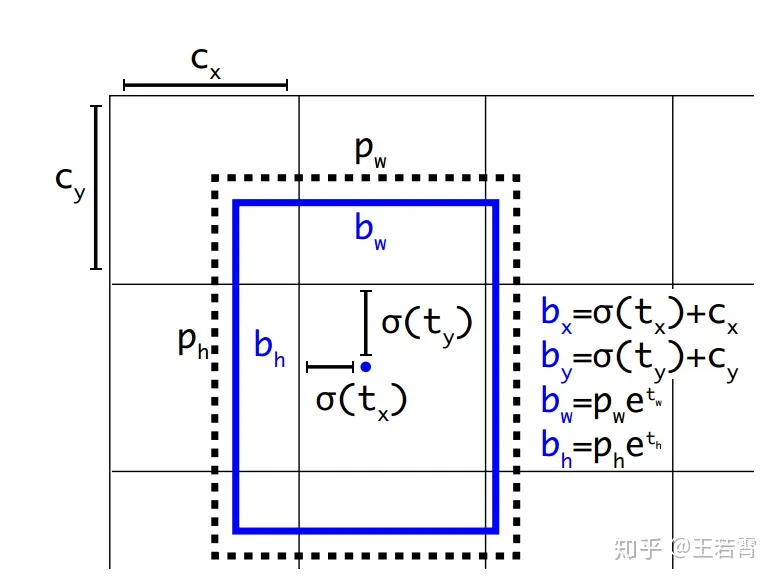

为了便于回归，将目标框的坐标变换为0-1的值。

对于x，y：是目标框的中心点，到对应区域中的比例。

例如，对应区域的左上角为原点(0, 0)

而后，目标框的中心点，相对于原点的偏移量的比例，即为xy值

关于置信度：

所有包含了目标的区域都视为1，其他区域都视为0.(标注过程)

### YOLO v1的缺陷

1. 对于重叠/小物体，检测性能差；
2. 只支持相同尺寸的图像输入；
3. 对于尺度不同的物体，检测框的位置存在误差

## YOLO v2

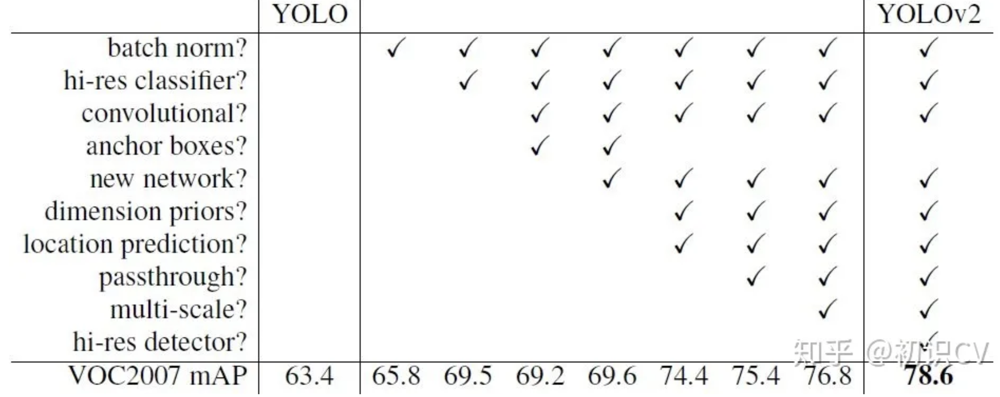

## 改进1: 模型

1. 去除所有的dropout， 加入batch norm

2. 将训练图像的输入改为448\*448，而不是v1中的224\*224

![image.jpeg](attachment:image.jpeg)

3. anchor boxes

在faster rcnn中，anchor采用了3中固定尺度和3种固定比例。

虽然这些是通过对数据集考察后确定下来的，但却不够精确。

YOLOv2中，采用了新的方式来确定模板框的尺寸


```
将voc中每种框的wh列出来，作为一个数据，然后进行聚类处理。(kmeans)
```

那么具体聚多少类？手动设定(超参数)

如果类别数量非常大，则会导致计算量增加

如果类别数量非常少，则会不够精确。

实验结果表明，anchor boxes选择为5，则会产生最优的平衡。

注意，这里的框之间的距离公式(不是欧氏距离)是$1-IoU$

4. 特征融合

直接对最后一层输出的feature map做回归，则会产生一个问题：对小尺度物体不够友好。


![image-2.jpeg](attachment:image-2.jpeg)

解决小目标检测的举措之一：用更大视野的图进行检测。

## YOLO v3: 更快更准

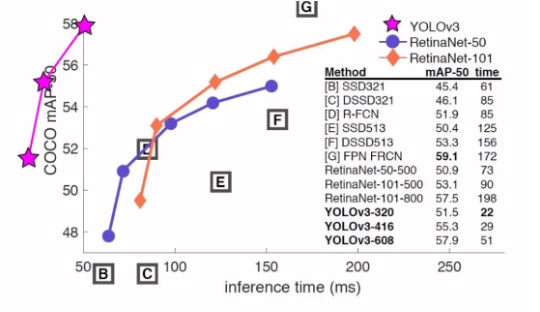

### 改进1: 多尺度检测

三种尺度进行检测

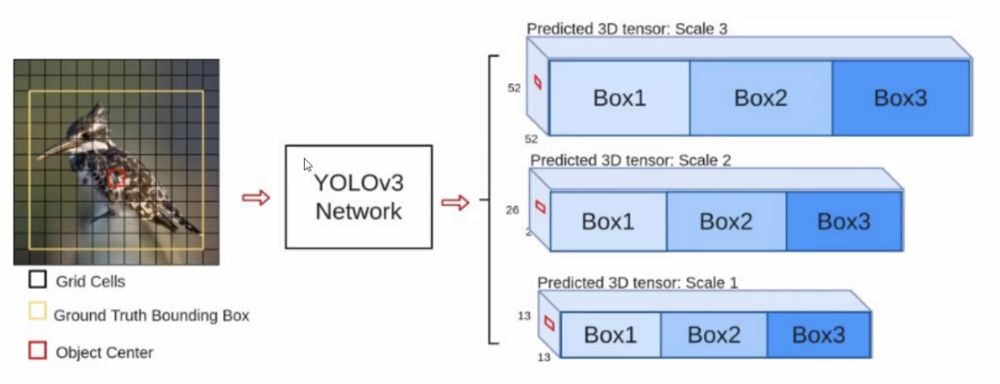

那么你会如何实现这样的方式？

* 图像金字塔？
* 特征金字塔？

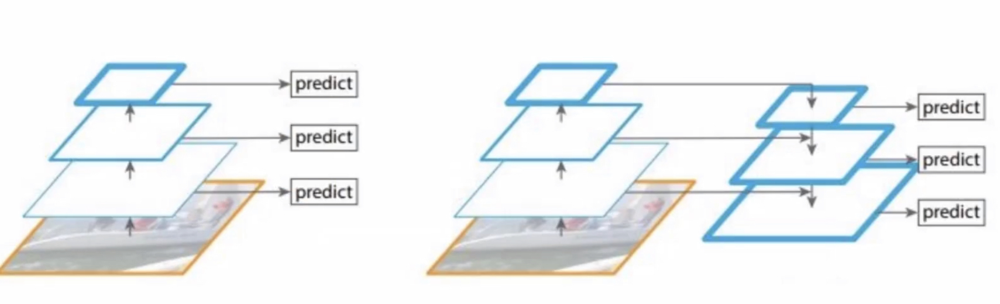

注意：这种方式共产生多少个anchor？

### 改进2: 跳层连接(resnet)

### 改进3: 网络结构

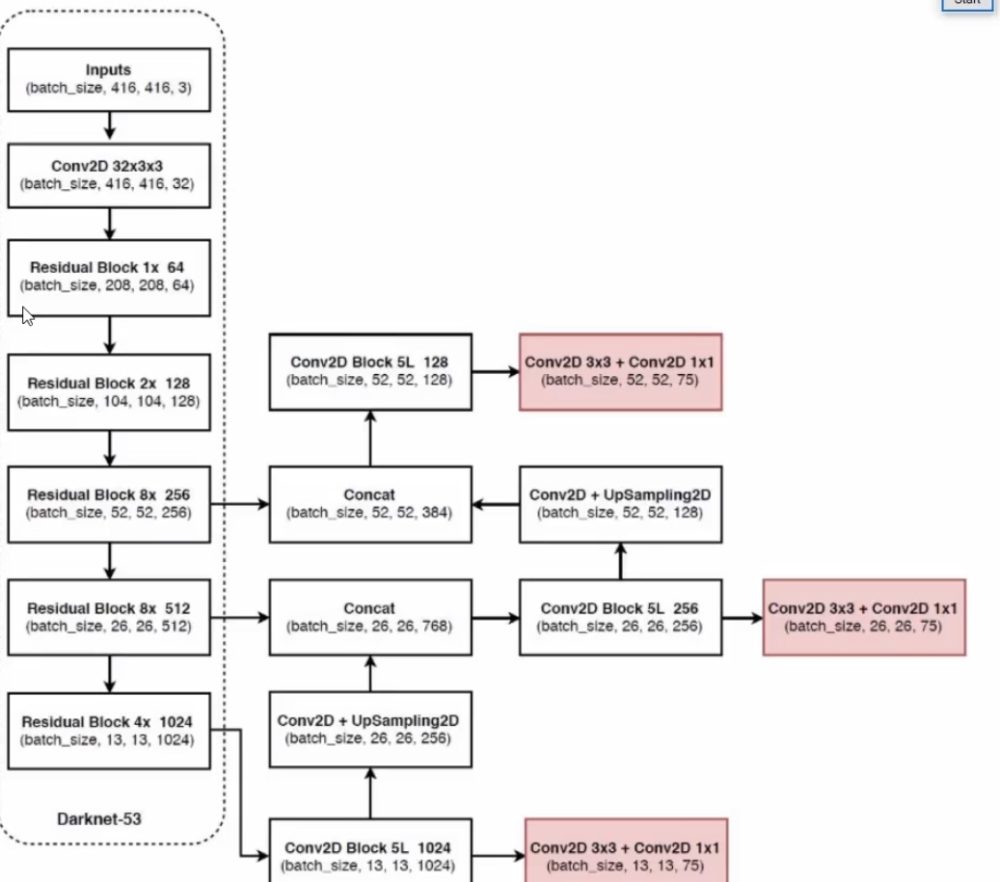

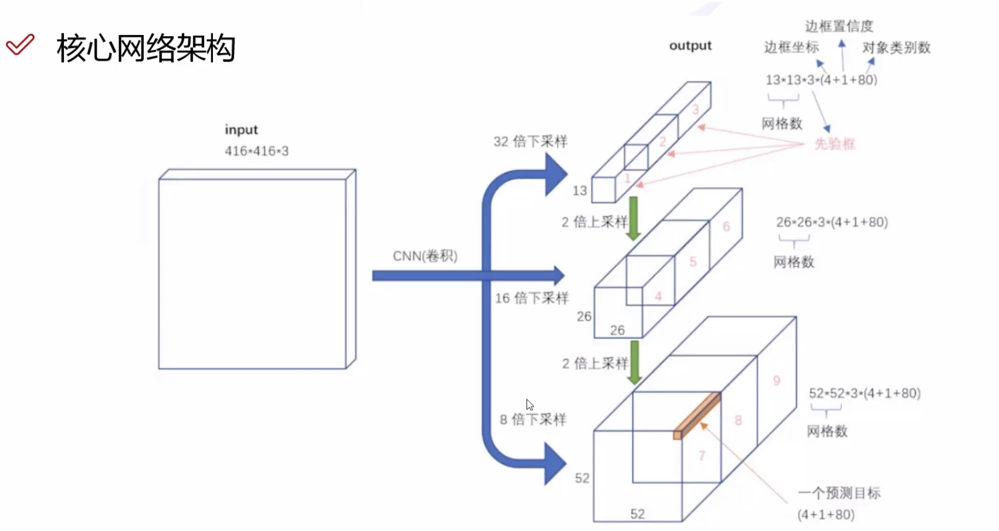